Big Data Analytics - Assignment 2

Sana Mehrab Beigi

**Binay Classification using Azure Databricks and Apache Spark MLlib**

Source: [UCI Machine Learning Repository (Adult Dataset)](https://archive.ics.uci.edu/dataset/2/adult)

Target Variable: Income (binary classification - '>50K' or '<=50K')

Features include age, workclass, education, marital status, occupation, etc

Number of Instances: 48842

| Variable Name   | Role    | Type        | Demographic       | Description                                                                 | Units | Missing Values |
|-----------------|---------|-------------|-------------------|-----------------------------------------------------------------------------|-------|----------------|
| age             | Feature | Integer     | Age               | N/A                                                                         |       | no             |
| workclass       | Feature | Categorical | Income            | Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked. |       | yes            |
| fnlwgt          | Feature | Integer     |                   |                                                                             |       | no             |
| education       | Feature | Categorical | Education Level   | Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool. |       | no             |
| education-num   | Feature | Integer     | Education Level   |                                                                             |       | no             |
| marital-status  | Feature | Categorical | Other             | Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse. |       | no             |
| occupation      | Feature | Categorical | Other             | Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces. |       | yes            |
| relationship    | Feature | Categorical | Other             | Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.          |       | no             |
| race            | Feature | Categorical | Race              | White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.                 |       | no             |
| sex             | Feature | Binary      | Sex               | Female, Male.                                                               |       | no             |
| capital-gain    | Feature | Integer     |                   |                                                                             |       | no             |
| capital-loss    | Feature | Integer     |                   |                                                                             |       | no             |
| hours-per-week  | Feature | Integer     |                   |                                                                             |       | no             |
| native-country  | Feature | Categorical | Other             | United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands. |       | yes            |
| income          | Target  | Binary      | Income            | >50K, <=50K.                                                                |       | no             |

### Additional Variable Information

Listing of attributes:

>50K, <=50K.
   
   1 - age: continuous
   
   2 - workclass: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked
   
   3 - fnlwgt: continuous
   
   4 - education: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool
   
   5 - education-num: continuous
   
   6 - marital-status: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse
   
   7 - occupation: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces
   
   8 - relationship: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried
   
   9 - race: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black
   
  10 - sex: Female, Male
   
  11 - capital-gain: continuous
   
  12 - capital-loss: continuous
   
  13 - hours-per-week: continuous
   
  14 - native-country: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands

In [0]:
%python
# Import necessary libraries
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, when, count, isnan, sum, round, trim
from pyspark.ml.feature import StringIndexer, VectorAssembler, StandardScaler, OneHotEncoder
from pyspark.ml.evaluation import BinaryClassificationEvaluator
from pyspark.ml import Pipeline

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

###1-Data Loading

1-1 Data Loading and Initial Exploration

In [0]:
# Load the dataset
df = spark.read.csv("/FileStore/tables/adult.csv", header=True, inferSchema=True)

# Display the dataset
display(df)
# Display dataset information
print(f"Number of records: {df.count()}\n")

print("Schema:")
df.printSchema()

age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
49,Private,160187,9th,5,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0,0,16,Jamaica,<=50K
52,Self-emp-not-inc,209642,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States,>50K
31,Private,45781,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Female,14084,0,50,United-States,>50K
42,Private,159449,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,5178,0,40,United-States,>50K


Number of records: 32561

Schema:
root
 |-- age: integer (nullable = true)
 |-- workclass: string (nullable = true)
 |-- fnlwgt: integer (nullable = true)
 |-- education: string (nullable = true)
 |-- education.num: integer (nullable = true)
 |-- marital.status: string (nullable = true)
 |-- occupation: string (nullable = true)
 |-- relationship: string (nullable = true)
 |-- race: string (nullable = true)
 |-- sex: string (nullable = true)
 |-- capital.gain: integer (nullable = true)
 |-- capital.loss: integer (nullable = true)
 |-- hours.per.week: integer (nullable = true)
 |-- native.country: string (nullable = true)
 |-- income: string (nullable = true)



1-2 changing columns name

In [0]:
# Define the mapping of old column names to new column names
column_mapping = {
    "education.num": "education_num",
    "marital.status": "marital_status",
    "capital.gain": "capital_gain",
    "capital.loss": "capital_loss",
    "hours.per.week": "hours_per_week",
    "native.country": "native_country"
}

# Apply renaming
for old_col, new_col in column_mapping.items():
    df = df.withColumnRenamed(old_col, new_col)

# Display the updated schema
df.printSchema()

pd.DataFrame(df.take(10), columns=df.columns).transpose()

root
 |-- age: integer (nullable = true)
 |-- workclass: string (nullable = true)
 |-- fnlwgt: integer (nullable = true)
 |-- education: string (nullable = true)
 |-- education_num: integer (nullable = true)
 |-- marital_status: string (nullable = true)
 |-- occupation: string (nullable = true)
 |-- relationship: string (nullable = true)
 |-- race: string (nullable = true)
 |-- sex: string (nullable = true)
 |-- capital_gain: integer (nullable = true)
 |-- capital_loss: integer (nullable = true)
 |-- hours_per_week: integer (nullable = true)
 |-- native_country: string (nullable = true)
 |-- income: string (nullable = true)



,0,1,2,3,4,5,6,7,8,9
age,39,50,38,53,28,37,49,52,31,42
workclass,State-gov,Self-emp-not-inc,Private,Private,Private,Private,Private,Self-emp-not-inc,Private,Private
fnlwgt,77516,83311,215646,234721,338409,284582,160187,209642,45781,159449
education,Bachelors,Bachelors,HS-grad,11th,Bachelors,Masters,9th,HS-grad,Masters,Bachelors
education_num,13,13,9,7,13,14,5,9,14,13
marital_status,Never-married,Married-civ-spouse,Divorced,Married-civ-spouse,Married-civ-spouse,Married-civ-spouse,Married-spouse-absent,Married-civ-spouse,Never-married,Married-civ-spouse
occupation,Adm-clerical,Exec-managerial,Handlers-cleaners,Handlers-cleaners,Prof-specialty,Exec-managerial,Other-service,Exec-managerial,Prof-specialty,Exec-managerial
relationship,Not-in-family,Husband,Not-in-family,Husband,Wife,Wife,Not-in-family,Husband,Not-in-family,Husband
race,White,White,White,Black,Black,White,Black,White,White,White
sex,Male,Male,Male,Male,Female,Female,Female,Male,Female,Male


1-3 Data Quality Assessment

checking for missing values and analyzing the distribution of our target variable.

In [0]:
%python
# Check for missing values
def missing_values_check(df):
    return df.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in df.columns])

missing_values = missing_values_check(df)
display(missing_values)

# Check class distribution
print("Target Variable Distribution:")
df.groupBy("income").count().show()


age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Target Variable Distribution:
+------+-----+
|income|count|
+------+-----+
|  >50K| 7841|
| <=50K|24720|
+------+-----+



1-4 Exploratory Data Analysis

1-4-1 checking for distinct values in categorical columns

In [0]:
# Get the list of categorical columns
categorical_columns = [t[0] for t in df.dtypes if t[1] == 'string']

# Store distinct value counts summary
distinct_values_count = []

# Total number of rows in the dataset
total_rows = df.count()

# Iterate over categorical columns to count occurrences and calculate percentage
for col_name in categorical_columns:
    distinct_count = df.select(col_name).distinct().count()  # Number of unique values in the column
    distinct_values_count.append((col_name, distinct_count))  # Store for summary table

# Convert summary list into DataFrame and display BEFORE calculating value counts
distinct_summary_df = spark.createDataFrame(distinct_values_count, ["Column", "Distinct Count"])
display(distinct_summary_df)  # Show distinct count summary

# Now, calculate and display distinct value counts for each column
for col_name in categorical_columns:
    distinct_values_with_count = (df.groupBy(col_name)
                                  .agg(count("*").alias("count"))
                                  .withColumn("percentage", round((col("count") / total_rows) * 100, 2))
                                  .orderBy(col("count"), ascending=False))  # Sort by frequency

    # Print and display distinct values with their frequency and percentage
    print(f"Distinct values and their count for column: {col_name}")
    display(distinct_values_with_count)


Column,Distinct Count
workclass,9
education,16
marital_status,7
occupation,15
relationship,6
race,5
sex,2
native_country,42
income,2


Distinct values and their count for column: workclass


workclass,count,percentage
Private,22696,69.7
Self-emp-not-inc,2541,7.8
Local-gov,2093,6.43
?,1836,5.64
State-gov,1298,3.99
Self-emp-inc,1116,3.43
Federal-gov,960,2.95
Without-pay,14,0.04
Never-worked,7,0.02


Distinct values and their count for column: education


education,count,percentage
HS-grad,10501,32.25
Some-college,7291,22.39
Bachelors,5355,16.45
Masters,1723,5.29
Assoc-voc,1382,4.24
11th,1175,3.61
Assoc-acdm,1067,3.28
10th,933,2.87
7th-8th,646,1.98
Prof-school,576,1.77


Distinct values and their count for column: marital_status


marital_status,count,percentage
Married-civ-spouse,14976,45.99
Never-married,10683,32.81
Divorced,4443,13.65
Separated,1025,3.15
Widowed,993,3.05
Married-spouse-absent,418,1.28
Married-AF-spouse,23,0.07


Distinct values and their count for column: occupation


occupation,count,percentage
Prof-specialty,4140,12.71
Craft-repair,4099,12.59
Exec-managerial,4066,12.49
Adm-clerical,3770,11.58
Sales,3650,11.21
Other-service,3295,10.12
Machine-op-inspct,2002,6.15
?,1843,5.66
Transport-moving,1597,4.9
Handlers-cleaners,1370,4.21


Distinct values and their count for column: relationship


relationship,count,percentage
Husband,13193,40.52
Not-in-family,8305,25.51
Own-child,5068,15.56
Unmarried,3446,10.58
Wife,1568,4.82
Other-relative,981,3.01


Distinct values and their count for column: race


race,count,percentage
White,27816,85.43
Black,3124,9.59
Asian-Pac-Islander,1039,3.19
Amer-Indian-Eskimo,311,0.96
Other,271,0.83


Distinct values and their count for column: sex


sex,count,percentage
Male,21790,66.92
Female,10771,33.08


Distinct values and their count for column: native_country


native_country,count,percentage
United-States,29170,89.59
Mexico,643,1.97
?,583,1.79
Philippines,198,0.61
Germany,137,0.42
Canada,121,0.37
Puerto-Rico,114,0.35
El-Salvador,106,0.33
India,100,0.31
Cuba,95,0.29


Distinct values and their count for column: income


income,count,percentage
<=50K,24720,75.92
>50K,7841,24.08


We have some "?" values but since they are < 5%-6% we gonna keep them and change them to unknown group. This prevents information loss and allows the model to learn patterns from known categories.

In [0]:
df = df.withColumn(
    "workclass", 
    when(trim(df["workclass"]) == "?", "Unknown").otherwise(df["workclass"])
)
df = df.withColumn(
    "occupation", 
    when(trim(df["occupation"]) == "?", "Unknown").otherwise(df["occupation"])
)
df = df.withColumn(
    "native_country", 
    when(trim(df["native_country"]) == "?", "Unknown").otherwise(df["native_country"])
)

In [0]:
#check changes in columns
df.select("workclass").distinct().show()
df.select("occupation").distinct().show()
df.select("native_country").distinct().show()

+-----------------+
|        workclass|
+-----------------+
|        State-gov|
|      Federal-gov|
|          Unknown|
| Self-emp-not-inc|
|        Local-gov|
|          Private|
|     Self-emp-inc|
|      Without-pay|
|     Never-worked|
+-----------------+

+------------------+
|        occupation|
+------------------+
|   Farming-fishing|
| Handlers-cleaners|
|    Prof-specialty|
|           Unknown|
|      Adm-clerical|
|   Exec-managerial|
|      Craft-repair|
|             Sales|
|      Tech-support|
|  Transport-moving|
|   Protective-serv|
|      Armed-Forces|
| Machine-op-inspct|
|     Other-service|
|   Priv-house-serv|
+------------------+

+-------------------+
|     native_country|
+-------------------+
| Dominican-Republic|
|            Ireland|
|               Cuba|
|          Guatemala|
|               Iran|
|             Taiwan|
|        El-Salvador|
|      United-States|
|              South|
|              Japan|
|          Nicaragua|
|             Canada|
|        

1-4-2 Descriptive statistics for numerical variables

In [0]:
print(df.dtypes)

[('age', 'int'), ('workclass', 'string'), ('fnlwgt', 'int'), ('education', 'string'), ('education_num', 'int'), ('marital_status', 'string'), ('occupation', 'string'), ('relationship', 'string'), ('race', 'string'), ('sex', 'string'), ('capital_gain', 'int'), ('capital_loss', 'int'), ('hours_per_week', 'int'), ('native_country', 'string'), ('income', 'string')]


In [0]:
# numeric_features = [t[0] for t in df.dtypes if t[1]=='int']
numeric_features = [t[0] for t in df.dtypes if t[1] == 'int']
df.select(numeric_features).describe().toPandas().transpose()

,0,1,2,3,4
summary,count,mean,stddev,min,max
age,32561,38.58164675532078,13.64043255358134,17,90
fnlwgt,32561,189778.36651208502,105549.97769702256,12285,1484705
education_num,32561,10.0806793403151,2.572720332067387,1,16
capital_gain,32561,1077.6488437087312,7385.2920848403755,0,99999
capital_loss,32561,87.303829734959,402.96021864899507,0,4356
hours_per_week,32561,40.437455852092995,12.347428681731863,1,99


1-4-3 Correlation between features

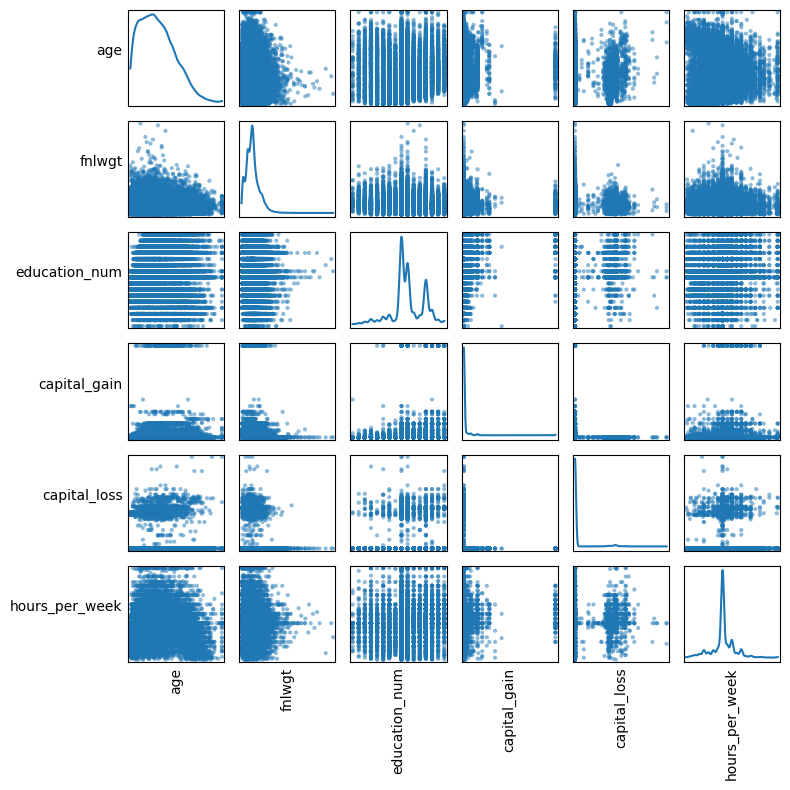

In [0]:
# df is our Spark DataFrame and numeric_features is a list of our numeric feature column names
numeric_data = df.select(numeric_features).toPandas()

# Create the scatter matrix plot
axs = pd.plotting.scatter_matrix(numeric_data, figsize=(8, 8), diagonal='kde') # `kde`: kernel density estimation (pdf); `hist`: histogram

# Adjustments for readability (optional, as scatter_matrix handles most of the layout and labeling well)
n = len(numeric_data.columns)
for i in range(n):
    # Adjust y-axis labels on the first column
    v = axs[i, 0]
    v.yaxis.label.set_rotation(0)
    v.yaxis.label.set_ha('right')
    v.set_yticks(()) # Hide labels and ticks
    # Rotate x-axis labels on the bottom row
    h = axs[n-1, i]
    h.xaxis.label.set_rotation(90)
    h.set_xticks(())
    

plt.tight_layout()
plt.show()

In [0]:
numeric_data.corr()

,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week
age,1.000000,-0.076646,0.036527,0.077674,0.057775,0.068756
fnlwgt,-0.076646,1.000000,-0.043195,0.000432,-0.010252,-0.018768
education_num,0.036527,-0.043195,1.000000,0.122630,0.079923,0.148123
capital_gain,0.077674,0.000432,0.122630,1.000000,-0.031615,0.078409
capital_loss,0.057775,-0.010252,0.079923,-0.031615,1.000000,0.054256
hours_per_week,0.068756,-0.018768,0.148123,0.078409,0.054256,1.000000


In [0]:
df = df.drop("fnlwgt")
display(df)

age,workclass,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
37,Private,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
49,Private,9th,5,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0,0,16,Jamaica,<=50K
52,Self-emp-not-inc,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States,>50K
31,Private,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Female,14084,0,50,United-States,>50K
42,Private,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,5178,0,40,United-States,>50K


### 2- Data Preprocessing and Feature Engineering

Now we'll prepare our data for modeling. This involves:

2-1 Converting categorical variables to numerical format

2-2 Creating feature vector

2-3 Scaling numerical features

In [0]:
%python
# Identify categorical and numerical columns
categorical_cols = ["workclass", "education", "marital_status", "occupation", 
                    "relationship", "race", "sex", "native_country"]

numerical_cols = ["age", "education_num", "capital_gain", "capital_loss", "hours_per_week"]


# Create string indexers for categorical variables
indexers = [StringIndexer(inputCol=col, outputCol=col+"_idx", handleInvalid="keep") for col in categorical_cols]

# Apply OneHotEncoder to all indexed categorical columns
encoders = [OneHotEncoder(inputCol=col+"_idx", outputCol=col+"_encoded") for col in categorical_cols]

# Create vector assembler for feature vector
assembler = VectorAssembler(
    inputCols=[col+"_encoded" for col in categorical_cols] + numerical_cols,
    outputCol="features")

# Create scaler
scaler = StandardScaler(inputCol="features", outputCol="scaled_features")

# Create label indexer
label_indexer = StringIndexer(inputCol="income", outputCol="label")

In [0]:
# Split data into training and testing sets
train_df, test_df = df.randomSplit([0.7, 0.3], seed=100)

###3-Model Implementation and Evaluation
Implementation of several Supervised ML models for binary classification: 
1. Logistic Regression
2. Random Forest
3. Decision Tree
4. Naïve Bayes
5. Gradient Boosting Trees
6. Linear Support Vector Machine
7. One-vs-Rest (using Logistic Regression as the base classifier)

Model Evaluations:
- Accuracy
- Precision
- Recall
- F1 Score
- Area Under ROC Curve (AUC)

**3-0 Common Setup**

Importing classifiesrs and define a function to create and evaluate models

In [0]:
%python
# Import classifier and evaluator algorithms
from pyspark.ml.classification import (
    LogisticRegression,
    RandomForestClassifier,
    DecisionTreeClassifier,
    NaiveBayes,
    GBTClassifier,
    LinearSVC,
    OneVsRest
)

base_stages = indexers + encoders +[assembler, scaler, label_indexer]

In [0]:
# Define a function to create and evaluate models
def create_and_evaluate_model(model, train_df, test_df):
    # Create pipeline
    pipeline = Pipeline(stages=indexers + encoders + [assembler, scaler, label_indexer, model])
    
    # Fit the pipeline
    model_pipeline = pipeline.fit(train_df)
    
    # Make predictions
    predictions = model_pipeline.transform(test_df)
    
    # Evaluate predictions - AUC (Area Under ROC Curve)
    evaluator = BinaryClassificationEvaluator(labelCol="label", rawPredictionCol="prediction")
    auc = evaluator.setMetricName("areaUnderROC").evaluate(predictions)

    # Calculate Accuracy
    accuracy = predictions.filter(predictions.label == predictions.prediction).count() / float(predictions.count())

    # Calculate Precision, Recall, and F1 Score Manually
    TP = predictions.filter((col("label") == 1) & (col("prediction") == 1)).count()
    FP = predictions.filter((col("label") == 0) & (col("prediction") == 1)).count()
    FN = predictions.filter((col("label") == 1) & (col("prediction") == 0)).count()
    TN = predictions.filter((col("label") == 0) & (col("prediction") == 0)).count()

    # Compute Precision, Recall, and F1 Score
    precision = TP / float(TP + FP) if (TP + FP) > 0 else 0
    recall = TP / float(TP + FN) if (TP + FN) > 0 else 0
    f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

    # Compute Confusion Matrix
    confusion_matrix = [[TN, FP], [FN, TP]]
    conf_matrix_df = pd.DataFrame(confusion_matrix, 
                              columns=["Predicted Negative", "Predicted Positive"], 
                              index=["Actual Negative", "Actual Positive"])
    
    return accuracy, precision, recall, f1_score, auc, conf_matrix_df, model_pipeline

**3-1 Logistic Regression**

Implementation of model, evaluation of model, feature importance analysis

In [0]:
# Create logistic regression model
lr = LogisticRegression(
    featuresCol="scaled_features",
    labelCol="label",
    maxIter=10,
    regParam=0.1,
    elasticNetParam=0.0
)

# Evaluate logistic regression model
lr_accuracy, lr_precision, lr_recall, lr_f1_score, lr_auc, lr_confusion_matrix, lr_model = create_and_evaluate_model(lr, train_df, test_df)

# Display metrics
metrics = spark.createDataFrame([
    ("Accuracy", f"{lr_accuracy:.3f}"),
    ("AUC", f"{lr_auc:.3f}"),
    ("Precision", f"{lr_precision:.3f}"),
    ("Recall", f"{lr_recall:.3f}"),
    ("F1 Score", f"{lr_f1_score:.3f}")
], ["Metric", "Value"])

print("Logistic Regression Performance:")
display(metrics)
print("Logistic Regression Confusion Matrix:")
print(lr_confusion_matrix)

# Get feature importance
feature_importance = pd.DataFrame(
    zip(assembler.getInputCols(), lr_model.stages[-1].coefficients),
    columns=["feature", "importance"]
)
feature_importance["abs_importance"] = abs(feature_importance["importance"])
feature_importance = feature_importance.sort_values("abs_importance", ascending=False)

# Display top 10 most important features
print("Top 5 Most Important Features for Logistic Regression:")
feature_importance.head(5)

Logistic Regression Performance:


Metric,Value
Accuracy,0.837
AUC,0.715
Precision,0.768
Recall,0.477
F1 Score,0.589


Logistic Regression Confusion Matrix:
                 Predicted Negative  Predicted Positive
Actual Negative                7083                 346
Actual Positive                1258                1148
Top 5 Most Important Features for Logistic Regression:


,feature,importance,abs_importance
11,capital_loss,0.116704,0.116704
12,hours_per_week,0.114733,0.114733
9,education_num,-0.082988,0.082988
5,race_encoded,0.061994,0.061994
6,sex_encoded,0.059513,0.059513


**3-2 Random Forest**

In [0]:
# Create Random Forest model
rf = RandomForestClassifier(
    featuresCol="scaled_features",
    labelCol="label",
    numTrees=100,
    maxDepth=5,
    seed=100
)

# Evaluate random forest model
rf_accuracy, rf_precision, rf_recall, rf_f1_score, rf_auc, rf_confusion_matrix, rf_model = create_and_evaluate_model(rf, train_df, test_df)

# Display metrics
rf_metrics = spark.createDataFrame([
    ("Accuracy", f"{rf_accuracy:.3f}"),
    ("AUC", f"{rf_auc:.3f}"),
    ("Precision", f"{rf_precision:.3f}"),
    ("Recall", f"{rf_recall:.3f}"),
    ("F1 Score", f"{rf_f1_score:.3f}")
], ["Metric", "Value"])

print("Random Forest Performance:")
display(rf_metrics)
print("Random Forest Confusion Matrix:")
print(rf_confusion_matrix)

# Get feature importance
rf_feature_importance = pd.DataFrame(
    zip(assembler.getInputCols(), rf_model.stages[-1].featureImportances),
    columns=["feature", "importance"]
)
rf_feature_importance["abs_importance"] = abs(rf_feature_importance["importance"])
rf_feature_importance = rf_feature_importance.sort_values("abs_importance", ascending=False)

# Display top 5 most important features
print("Top 5 Most Important Features for Random Forest:")
rf_feature_importance.head(5)

Random Forest Performance:


Metric,Value
Accuracy,0.826
AUC,0.673
Precision,0.820
Recall,0.372
F1 Score,0.511


Random Forest Confusion Matrix:
                 Predicted Negative  Predicted Positive
Actual Negative                7233                 196
Actual Positive                1512                 894
Top 5 Most Important Features for Random Forest:


,feature,importance,abs_importance
11,capital_loss,0.023022,0.023022
12,hours_per_week,0.016349,0.016349
9,education_num,0.003876,0.003876
5,race_encoded,0.001837,0.001837
3,occupation_encoded,0.001427,0.001427


**3-3 Decision Tree**

In [0]:
# Create Decision Tree model
dt = DecisionTreeClassifier(
    featuresCol="scaled_features",
    labelCol="label",
    maxDepth=5,
    seed=100
)

# Evaluate decision tree model
dt_accuracy, dt_precision, dt_recall, dt_f1_score, dt_auc, dt_confusion_matrix, dt_model = create_and_evaluate_model(dt, train_df, test_df)

# Display metrics
dt_metrics = spark.createDataFrame([
    ("Accuracy", f"{dt_accuracy:.3f}"),
    ("AUC", f"{dt_auc:.3f}"),
    ("Precision", f"{dt_precision:.3f}"),
    ("Recall", f"{dt_recall:.3f}"),
    ("F1 Score", f"{dt_f1_score:.3f}")
], ["Metric", "Value"])

print("Decision Tree Performance:")
display(dt_metrics)
print("Decision Tree Confusion Matrix:")
print(dt_confusion_matrix)

# Get feature importance
dt_feature_importance = pd.DataFrame(
    zip(assembler.getInputCols(), dt_model.stages[-1].featureImportances),
    columns=["feature", "importance"]
)
dt_feature_importance["abs_importance"] = abs(dt_feature_importance["importance"])
dt_feature_importance = dt_feature_importance.sort_values("abs_importance", ascending=False)

# Display top 5 most important features
print("Top 5 Most Important Features for Decision Tree:")
dt_feature_importance.head(5)

Decision Tree Performance:


Metric,Value
Accuracy,0.835
AUC,0.709
Precision,0.775
Recall,0.461
F1 Score,0.578


Decision Tree Confusion Matrix:
                 Predicted Negative  Predicted Positive
Actual Negative                7107                 322
Actual Positive                1297                1109
Top 5 Most Important Features for Decision Tree:


,feature,importance,abs_importance
10,capital_gain,0.000618,0.000618
1,education_encoded,0.000333,0.000333
0,workclass_encoded,0.000000,0.000000
2,marital_status_encoded,0.000000,0.000000
3,occupation_encoded,0.000000,0.000000


**3-4 Naïve Bayes**

Unlike tree-based models (e.g., Random Forest, XGBoost) or linear models (e.g., Logistic Regression), Naïve Bayes does not compute feature importance directly, so we won't analyze it.

In [0]:
# Create Naive Bayes model
nb = NaiveBayes(
    featuresCol="scaled_features",
    labelCol="label",
    smoothing=1.0,
    modelType="multinomial"
)

# Evaluate Naive Bayes model
nb_accuracy, nb_precision, nb_recall, nb_f1_score, nb_auc, nb_confusion_matrix, nb_model = create_and_evaluate_model(nb, train_df, test_df)

# Display metrics
nb_metrics = spark.createDataFrame([
    ("Accuracy", f"{nb_accuracy:.3f}"),
    ("AUC", f"{nb_auc:.3f}"),
    ("Precision", f"{nb_precision:.3f}"),
    ("Recall", f"{nb_recall:.3f}"),
    ("F1 Score", f"{nb_f1_score:.3f}")
], ["Metric", "Value"])

print("Naive Bayes Performance:")
display(nb_metrics)
print("Naive Bayes Confusion Matrix:")
print(nb_confusion_matrix)

Naive Bayes Performance:


Metric,Value
Accuracy,0.787
AUC,0.797
Precision,0.543
Recall,0.817
F1 Score,0.652


Naive Bayes Confusion Matrix:
                 Predicted Negative  Predicted Positive
Actual Negative                5772                1657
Actual Positive                 440                1966


**3-5 Gradient Boosting Trees**

In [0]:
# Create Gradient Boosting Trees model
gbt = GBTClassifier(
    featuresCol="scaled_features",
    labelCol="label",
    maxIter=100,
    maxDepth=5,
    seed=100
)

# Evaluate Gradient Boosting Trees model
gbt_accuracy, gbt_precision, gbt_recall, gbt_f1_score, gbt_auc, gbt_confusion_matrix, gbt_model = create_and_evaluate_model(gbt, train_df, test_df)

# Display metrics
gbt_metrics = spark.createDataFrame([
    ("Accuracy", f"{gbt_accuracy:.3f}"),
    ("AUC", f"{gbt_auc:.3f}"),
    ("Precision", f"{gbt_precision:.3f}"),
    ("Recall", f"{gbt_recall:.3f}"),
    ("F1 Score", f"{gbt_f1_score:.3f}")
], ["Metric", "Value"])

print("Gradient Boosting Trees Performance:")
display(gbt_metrics)
print("Gradient Boosting Trees Confusion Matrix:")
print(gbt_confusion_matrix)

# Get feature importance
gbt_feature_importance = pd.DataFrame(
    zip(assembler.getInputCols(), gbt_model.stages[-1].featureImportances),
    columns=["feature", "importance"]
)
gbt_feature_importance["abs_importance"] = abs(gbt_feature_importance["importance"])
gbt_feature_importance = gbt_feature_importance.sort_values("abs_importance", ascending=False)

# Display top 5 most important features
print("Top 5 Most Important Features for Gradient Boosting Trees:")
gbt_feature_importance.head(5)

Gradient Boosting Trees Performance:


Metric,Value
Accuracy,0.859
AUC,0.784
Precision,0.746
Recall,0.639
F1 Score,0.689


Gradient Boosting Trees Confusion Matrix:
                 Predicted Negative  Predicted Positive
Actual Negative                6906                 523
Actual Positive                 868                1538
Top 5 Most Important Features for Gradient Boosting Trees:


,feature,importance,abs_importance
1,education_encoded,0.017565,0.017565
2,marital_status_encoded,0.010341,0.010341
11,capital_loss,0.010315,0.010315
6,sex_encoded,0.008192,0.008192
0,workclass_encoded,0.007033,0.007033


**3-6 Linear Support Vector Machine**

In [0]:
# Create Linear Support Vector Machine model
lsvm = LinearSVC(
    featuresCol="scaled_features",
    labelCol="label",
    maxIter=100,
    regParam=0.1
)

# Evaluate Linear Support Vector Machine model
lsvm_accuracy, lsvm_precision, lsvm_recall, lsvm_f1_score, lsvm_auc, lsvm_confusion_matrix, lsvm_model = create_and_evaluate_model(lsvm, train_df, test_df)

# Display metrics
lsvm_metrics = spark.createDataFrame([
    ("Accuracy", f"{lsvm_accuracy:.3f}"),
    ("AUC", f"{lsvm_auc:.3f}"),
    ("Precision", f"{lsvm_precision:.3f}"),
    ("Recall", f"{lsvm_recall:.3f}"),
    ("F1 Score", f"{lsvm_f1_score:.3f}")
], ["Metric", "Value"])

print("Linear Support Vector Machine Performance:")
display(lsvm_metrics)
print("Linear Support Vector Machine Confusion Matrix:")
print(lsvm_confusion_matrix)

# Get feature importance
lsvm_model_stage = lsvm_model.stages[-1]  # Assuming the LinearSVCModel is the last stage in the pipeline
lsvm_feature_importance = pd.DataFrame(
    zip(assembler.getInputCols(), lsvm_model_stage.coefficients.toArray()),
    columns=["feature", "importance"]
)
lsvm_feature_importance["abs_importance"] = abs(lsvm_feature_importance["importance"])
lsvm_feature_importance = lsvm_feature_importance.sort_values("abs_importance", ascending=False)

# Display top 5 most important features
print("Top 5 Most Important Features for Linear Support Vector Machine:")
lsvm_feature_importance.head(5)

Linear Support Vector Machine Performance:


Metric,Value
Accuracy,0.840
AUC,0.727
Precision,0.762
Recall,0.505
F1 Score,0.608


Linear Support Vector Machine Confusion Matrix:
                 Predicted Negative  Predicted Positive
Actual Negative                7049                 380
Actual Positive                1190                1216
Top 5 Most Important Features for Linear Support Vector Machine:


,feature,importance,abs_importance
11,capital_loss,0.134544,0.134544
12,hours_per_week,0.110463,0.110463
9,education_num,-0.106996,0.106996
10,capital_gain,-0.056216,0.056216
1,education_encoded,-0.054189,0.054189


**3-7 One-vs-Rest (using Logistic Regression as the base classifier)**

In [0]:
# Create One-vs-Rest classifier with Logistic Regression as the base classifier
ovr = OneVsRest(classifier=lr)

# Evaluate One-vs-Rest model
ovr_accuracy, ovr_precision, ovr_recall, ovr_f1_score, ovr_auc, ovr_confusion_matrix, ovr_model = create_and_evaluate_model(ovr, train_df, test_df)

# Display metrics
ovr_metrics = spark.createDataFrame([
    ("Accuracy", f"{ovr_accuracy:.3f}"),
    ("AUC", f"{ovr_auc:.3f}"),
    ("Precision", f"{ovr_precision:.3f}"),
    ("Recall", f"{ovr_recall:.3f}"),
    ("F1 Score", f"{ovr_f1_score:.3f}")
], ["Metric", "Value"])

print("One-vs-Rest (Logistic Regression) Performance:")
display(ovr_metrics)
print("One-vs-Rest (Logistic Regression) Confusion Matrix:")
print(ovr_confusion_matrix)

One-vs-Rest (Logistic Regression) Performance:


Metric,Value
Accuracy,0.837
AUC,0.715
Precision,0.768
Recall,0.477
F1 Score,0.589


One-vs-Rest (Logistic Regression) Confusion Matrix:
                 Predicted Negative  Predicted Positive
Actual Negative                7083                 346
Actual Positive                1258                1148


**Model Comparison and Visualization**

Let's create visualizations to compare the performance of all models and show a summary table comparing all models across these metrics

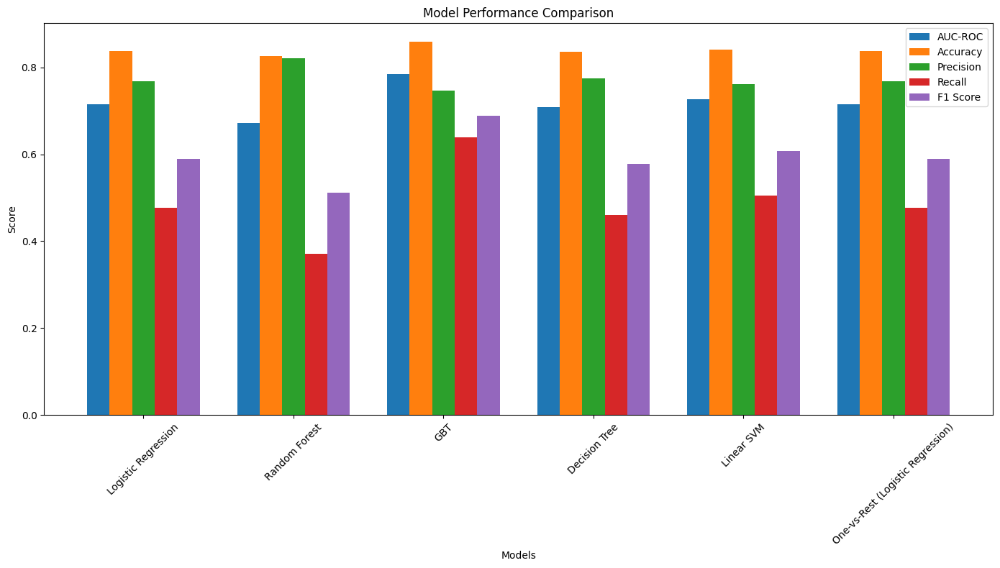

Model,AUC-ROC,Accuracy,Precision,Recall,F1 Score
Logistic Regression,0.715283123013125,0.8369089984748348,0.7684069611780455,0.4771404821280133,0.5887179487179488
Random Forest,0.6725939895180612,0.8263345195729538,0.8201834862385321,0.371571072319202,0.5114416475972541
GBT,0.7844177302962363,0.8585663446873412,0.7462396894711305,0.6392352452202826,0.6886053279606
Decision Tree,0.708793676284006,0.8353838332486019,0.7749825296995109,0.4609310058187864,0.5780557727391191
Linear SVM,0.7271261318145387,0.8403660396542959,0.7619047619047619,0.5054031587697423,0.6076961519240379
One-vs-Rest (Logistic Regression),0.715283123013125,0.8369089984748348,0.7684069611780455,0.4771404821280133,0.5887179487179488


In [0]:
%python
# Collect performance metrics
model_metrics = pd.DataFrame({
    'Model': ['Logistic Regression', 'Random Forest', 'GBT', 'Decision Tree', 'Linear SVM', 'One-vs-Rest (Logistic Regression)'],
    'AUC-ROC': [lr_auc, rf_auc, gbt_auc, dt_auc, lsvm_auc, ovr_auc],
    'Accuracy': [lr_accuracy, rf_accuracy, gbt_accuracy, dt_accuracy, lsvm_accuracy, ovr_accuracy],
    'Precision': [lr_precision, rf_precision, gbt_precision, dt_precision, lsvm_precision, ovr_precision],
    'Recall': [lr_recall, rf_recall, gbt_recall, dt_recall, lsvm_recall, ovr_recall],
    'F1 Score': [lr_f1_score, rf_f1_score, gbt_f1_score, dt_f1_score, lsvm_f1_score, ovr_f1_score]
})

# Create visualization
import matplotlib.pyplot as plt

metrics = ['AUC-ROC', 'Accuracy', 'Precision', 'Recall', 'F1 Score']
x = range(len(model_metrics['Model']))
width = 0.15

plt.figure(figsize=(14, 8))

for i, metric in enumerate(metrics):
    plt.bar([j + i * width for j in x], model_metrics[metric], width, label=metric)

plt.xlabel('Models')
plt.ylabel('Score')
plt.title('Model Performance Comparison')
plt.xticks([j + width * 2 for j in x], model_metrics['Model'], rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# Create Spark DataFrame for summary table
summary_table = spark.createDataFrame(model_metrics)

# Display summary table
display(summary_table)

In [0]:
# Display summary table
summary_table = summary_table.selectExpr("Model", "round(`AUC-ROC`, 3) as `AUC-ROC`", "round(Accuracy, 3) as Accuracy", "round(Precision, 3) as Precision", "round(Recall, 3) as Recall", "round(`F1 Score`, 3) as `F1 Score`")
display(summary_table)

Model,AUC-ROC,Accuracy,Precision,Recall,F1 Score
Logistic Regression,0.715,0.837,0.768,0.477,0.589
Random Forest,0.673,0.826,0.82,0.372,0.511
GBT,0.784,0.859,0.746,0.639,0.689
Decision Tree,0.709,0.835,0.775,0.461,0.578
Linear SVM,0.727,0.84,0.762,0.505,0.608
One-vs-Rest (Logistic Regression),0.715,0.837,0.768,0.477,0.589


### 4- Cross-Validation for Model Selection

num folds = 3

In [0]:
%python
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder

def tune_model(pipeline, paramGrid, train_data, num_folds=3):
    evaluator = BinaryClassificationEvaluator(
        labelCol="label",
        rawPredictionCol="rawPrediction",
        metricName="areaUnderROC"
    )
    
    crossval = CrossValidator(
        estimator=pipeline,
        estimatorParamMaps=paramGrid,
        evaluator=evaluator,
        numFolds=num_folds,
        seed=100
    )
    
    # Fit cross-validation model
    cv_model = crossval.fit(train_data)
    
    # Get best model and its performance
    best_model = cv_model.bestModel
    best_score = evaluator.evaluate(best_model.transform(test_df))
    
    # Get best parameters
    best_params = best_model.stages[-1].extractParamMap()
    
    return best_model, best_score, best_params


4-1 Tuning hyperparameters(Optimizing Each Algorithm Independently)

In [0]:
### Tune Logistic Regression
lr = LogisticRegression(featuresCol="scaled_features", labelCol="label")
lr_pipeline = Pipeline(stages=base_stages + [lr])

lr_paramGrid = ParamGridBuilder() \
    .addGrid(lr.regParam, [0.01, 0.1, 1.0]) \
    .addGrid(lr.elasticNetParam, [0.0, 0.5, 1.0]) \
    .addGrid(lr.maxIter, [10, 20]) \
    .build()

best_lr_model, lr_score, lr_params = tune_model(lr_pipeline, lr_paramGrid, train_df)

In [0]:
### Tune Random Forest
rf = RandomForestClassifier(featuresCol="scaled_features", labelCol="label")
rf_pipeline = Pipeline(stages=base_stages + [rf])

rf_paramGrid = ParamGridBuilder() \
    .addGrid(rf.numTrees, [20, 50, 100]) \
    .addGrid(rf.maxDepth, [5, 10, 20]) \
    .build()

best_rf_model, rf_score, rf_params = tune_model(rf_pipeline, rf_paramGrid, train_df)


In [0]:
### Tune Decision Tree
dt = DecisionTreeClassifier(featuresCol="scaled_features", labelCol="label")
dt_pipeline = Pipeline(stages=base_stages + [dt])

dt_paramGrid = ParamGridBuilder() \
    .addGrid(dt.maxDepth, [5, 10, 20]) \
    .addGrid(dt.minInstancesPerNode, [1, 2, 4]) \
    .build()

best_dt_model, dt_score, dt_params = tune_model(dt_pipeline, dt_paramGrid, train_df)

In [0]:
### Tune Gradient-Boosted Tree
gbt = GBTClassifier(featuresCol="scaled_features", labelCol="label")
gbt_pipeline = Pipeline(stages=base_stages + [gbt])

gbt_paramGrid = ParamGridBuilder() \
    .addGrid(gbt.maxIter, [20]) \
    .addGrid(gbt.maxDepth, [10]) \
    .build()

best_gbt_model, gbt_score, gbt_params = tune_model(gbt_pipeline, gbt_paramGrid, train_df)

In [0]:
### Tune Naive Bayes
nb = NaiveBayes(featuresCol="scaled_features", labelCol="label")
nb_pipeline = Pipeline(stages=base_stages + [nb])

nb_paramGrid = ParamGridBuilder() \
    .addGrid(nb.smoothing, [0.01, 0.1, 1.0]) \
    .build()

best_nb_model, nb_score, nb_params = tune_model(nb_pipeline, nb_paramGrid, train_df)


In [0]:
### Tune Linear Support Vector Machine
lsvm = LinearSVC(featuresCol="scaled_features", labelCol="label")
lsvm_pipeline = Pipeline(stages=base_stages + [lsvm])

lsvm_paramGrid = ParamGridBuilder() \
    .addGrid(lsvm.regParam, [0.01, 0.1, 1.0]) \
    .addGrid(lsvm.maxIter, [10, 20]) \
    .build()

best_lsvm_model, lsvm_score, lsvm_params = tune_model(lsvm_pipeline, lsvm_paramGrid, train_df)

In [0]:
%python
### Tune One-vs-Rest with Logistic Regression
lr = LogisticRegression(featuresCol="scaled_features", labelCol="label")
ovr = OneVsRest(classifier=lr)
ovr_pipeline = Pipeline(stages=base_stages + [ovr])

ovr_paramGrid = ParamGridBuilder() \
    .addGrid(lr.regParam, [0.01, 0.1, 1.0]) \
    .addGrid(lr.elasticNetParam, [0.0, 0.5, 1.0]) \
    .addGrid(lr.maxIter, [10, 20]) \
    .build()

best_ovr_model, ovr_score, ovr_params = tune_model(ovr_pipeline, ovr_paramGrid, train_df)

4-2 Comparing Best Versions of Each Algorithm

In [0]:
# Convert parameters to string
lr_params_str = str(lr_params)
rf_params_str = str(rf_params)
dt_params_str = str(dt_params)
nb_params_str = str(nb_params)
gbt_params_str = str(gbt_params)
lsvm_params_str = str(lsvm_params)
ovr_params_str = str(ovr_params)

# Create comparison DataFrame
model_comparison = pd.DataFrame({
    'Algorithm': ['Logistic Regression', 'Random Forest', 'Decision Tree', 'Naive Bayes', 'GBT', 'Lineasr Support Vector Machine', 'One-vs-Rest with Logistic Regression'],
    'Best AUC-ROC': [lr_score, rf_score, dt_score, nb_score, gbt_score, lsvm_score, ovr_score],
    'Best Parameters': [lr_params_str, rf_params_str, dt_params_str, nb_params_str, gbt_params_str, lsvm_params_str, ovr_params_str]
})

display(model_comparison.sort_values('Best AUC-ROC', ascending=False))
print("Model Comparison Results:")

Algorithm Best AUC-ROC Best Parameters Random Forest 0.9134796942225119 {Param(parent='RandomForestClassifier_4e5dcc03a244', name='bootstrap', doc='Whether bootstrap samples are used when building trees.'): True, Param(parent='RandomForestClassifier_4e5dcc03a244', name='cacheNodeIds', doc='If false, the algorithm will pass trees to executors to match instances with nodes. If true, the algorithm will cache node IDs for each instance. Caching can speed up training of deeper trees. Users can set how often should the cache be checkpointed or disable it by setting checkpointInterval.'): False, Param(parent='RandomForestClassifier_4e5dcc03a244', name='checkpointInterval', doc='set checkpoint interval (>= 1) or disable checkpoint (-1). E.g. 10 means that the cache will get checkpointed every 10 iterations. Note: this setting will be ignored if the checkpoint directory is not set in the SparkContext.'): 10, Param(parent='RandomForestClassifier_4e5dcc03a244', name='featureSubsetStrategy', doc="The number of features to consider for splits at each tree node. Supported options: 'auto' (choose automatically for task: If numTrees == 1, set to 'all'. If numTrees > 1 (forest), set to 'sqrt' for classification and to 'onethird' for regression), 'all' (use all features), 'onethird' (use 1/3 of the features), 'sqrt' (use sqrt(number of features)), 'log2' (use log2(number of features)), 'n' (when n is in the range (0, 1.0], use n * number of features. When n is in the range (1, number of features), use n features). default = 'auto'"): 'auto', Param(parent='RandomForestClassifier_4e5dcc03a244', name='featuresCol', doc='features column name.'): 'scaled_features', Param(parent='RandomForestClassifier_4e5dcc03a244', name='impurity', doc='Criterion used for information gain calculation (case-insensitive). Supported options: entropy, gini'): 'gini', Param(parent='RandomForestClassifier_4e5dcc03a244', name='labelCol', doc='label column name.'): 'label', Param(parent='RandomForestClassifier_4e5dcc03a244', name='leafCol', doc='Leaf indices column name. Predicted leaf index of each instance in each tree by preorder.'): '', Param(parent='RandomForestClassifier_4e5dcc03a244', name='maxBins', doc='Max number of bins for discretizing continuous features. Must be >=2 and >= number of categories for any categorical feature.'): 32, Param(parent='RandomForestClassifier_4e5dcc03a244', name='maxDepth', doc='Maximum depth of the tree. (>= 0) E.g., depth 0 means 1 leaf node; depth 1 means 1 internal node + 2 leaf nodes. Must be in range [0, 30].'): 20, Param(parent='RandomForestClassifier_4e5dcc03a244', name='maxMemoryInMB', doc='Maximum memory in MB allocated to histogram aggregation. If too small, then 1 node will be split per iteration, and its aggregates may exceed this size.'): 256, Param(parent='RandomForestClassifier_4e5dcc03a244', name='minInfoGain', doc='Minimum information gain for a split to be considered at a tree node.'): 0.0, Param(parent='RandomForestClassifier_4e5dcc03a244', name='minInstancesPerNode', doc='Minimum number of instances each child must have after split. If a split causes the left or right child to have fewer than minInstancesPerNode, the split will be discarded as invalid. Should be >= 1.'): 1, Param(parent='RandomForestClassifier_4e5dcc03a244', name='minWeightFractionPerNode', doc='Minimum fraction of the weighted sample count that each child must have after split. If a split causes the fraction of the total weight in the left or right child to be less than minWeightFractionPerNode, the split will be discarded as invalid. Should be in interval [0.0, 0.5).'): 0.0, Param(parent='RandomForestClassifier_4e5dcc03a244', name='numTrees', doc='Number of trees to train (>= 1).'): 100, Param(parent='RandomForestClassifier_4e5dcc03a244', name='predictionCol', doc='prediction column name.'): 'prediction', Param(parent='RandomForestClassifier_4e5dcc03a244', name='probabilityCol', doc='Column name for predicted class conditional probabilities. Note:

Model Comparison Results:


4-3 Selecting Final Model

In [0]:
# Get the best performing algorithm
best_algorithm = model_comparison.sort_values('Best AUC-ROC', ascending=False).iloc[0]
display(best_algorithm)
print("\nSelected Best Model:")

Algorithm                                              Random Forest
Best AUC-ROC                                                 0.91348
Best Parameters    {Param(parent='RandomForestClassifier_4e5dcc03...
Name: 1, dtype: object


Selected Best Model:


4-4 Final Evaluation on Test Set

In [0]:
%python
# Use the best model for final predictions
if best_algorithm['Algorithm'] == 'Logistic Regression':
    final_model = best_lr_model
elif best_algorithm['Algorithm'] == 'Random Forest':
    final_model = best_rf_model
elif best_algorithm['Algorithm'] == 'Decision Tree':
    final_model = best_dt_model
elif best_algorithm['Algorithm'] == 'Naïve Bayes':
    final_model = best_nb_model
elif best_algorithm['Algorithm'] == 'Gradient Boosting Trees':
    final_model = best_gbt_model
elif best_algorithm['Algorithm'] == 'Linear Support Vector Machine':
    final_model = best_lsvm_model
elif best_algorithm['Algorithm'] == 'One-vs-Rest':
    final_model = best_ovr_model

# Make predictions on test set
final_predictions = final_model.transform(test_df)

# Define evaluator
evaluator = BinaryClassificationEvaluator(rawPredictionCol="rawPrediction")

# Calculate final metrics
final_auc = evaluator.evaluate(final_predictions)
final_accuracy = final_predictions.filter(col("prediction") == col("label")).count() / final_predictions.count()
final_precision = final_predictions.filter((col("prediction") == 1) & (col("label") == 1)).count() / final_predictions.filter(col("prediction") == 1).count()
final_recall = final_predictions.filter((col("prediction") == 1) & (col("label") == 1)).count() / final_predictions.filter(col("label") == 1).count()
final_f1 = 2 * (final_precision * final_recall) / (final_precision + final_recall)

# Confusion matrix
tp = final_predictions.filter((col("prediction") == 1) & (col("label") == 1)).count()
tn = final_predictions.filter((col("prediction") == 0) & (col("label") == 0)).count()
fp = final_predictions.filter((col("prediction") == 1) & (col("label") == 0)).count()
fn = final_predictions.filter((col("prediction") == 0) & (col("label") == 1)).count()

print("\nFinal Model Performance on Test Set:")
print(f"AUC-ROC: {final_auc:.3f}")
print(f"Accuracy: {final_accuracy:.3f}")
print(f"Precision: {final_precision:.3f}")
print(f"Recall: {final_recall:.3f}")
print(f"F1 Score: {final_f1:.3f}")
print(f"Confusion Matrix: TP={tp}, TN={tn}, FP={fp}, FN={fn}")


Final Model Performance on Test Set:
AUC-ROC: 0.913
Accuracy: 0.858
Precision: 0.767
Recall: 0.603
F1 Score: 0.676
Confusion Matrix: TP=1452, TN=6988, FP=441, FN=954
